## Interpretable Machine Learning Test

#### Conditional Inference trees and forest

 - https://github.com/rmill040/citrees
     - Also has random forest available to use 
     - If needed can change base estimator in sci-kit random forest to the CI tree
     

#### Other models that have feature importance directly

 - XGboost
 - Random Forest
 - Gradient Boosting Regressor
 - Histogram Gradient Boosting Regressor
 - CatBooster - provides gradient boosting with categorical features

#### Tree interpreter 

 - For the tree models can use the treeinterpreter library to help with local interpretability
 - To help with visualization can use the waterfallcharts library

#### Glass Box Models

 - Explainable Boosting Machine (EBM)
    - Part of Microsoft's InterpretML framework
    - Leverages Generalized Additive Models 
    - Incorporates bagging and gradient boosting
    - Global and local interpretability
 
 - Skoped Rules
    - Only works for classification
    - Uses binary rules learned from an ensemble of trees
    - Good for imbalanced datasets, while maintaining interpretability
    - Global and local interpretability

#### Rulefit

 - Algorithm learns sparse linear models that include automatically detected interaction effects in the form of decision rules.
 - Makes new features that are decision rules. RuleFit automatically generates these features from decision trees.

#### Genetic algorithim feature engineering and feature selection libraries to possibly try:

 - https://evolutionary-forest.readthedocs.io/en/latest/readme.html#features
 - sklearn-genetic

#### Permutation Importance
 - Possible option for Permutation Importance with Multicollinear or Correlated Features
     - https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance_multicollinear.html
     - Investigate if possible to change this so that a whole group would be permuted at a time instead of picking a single feature from the group
 - Need to search if there are any other options available

#### SHAP and LIME 

 - Imported libraries that can be used with different model types
 - Shows the positive and negative contributions from every variable for a given prediction
 - SHAP
     - Shapley values are the average marginal contribution by a feature across all possible subsets.
     - Not a pure implementation of the algorithm to get the shapley values, uses sampling and leverages some model classes' intrinsic parameters.
     - Has a wide variety of explainers available for different model types such as treeexplainer, deepexplainer, and gradientexplainer.
 - LIME
     - Local Interpretable Model-agnostic Explanations (LIME) operates on a local scale.
     - Can visualize the decision boundary of a model when zooming in to a single sample
     - After selecting sample LIME trains a surrogate model using pertubations of the selected samples' features

#### Neural network interpretability libraries

 - Skater
 - tf-explain
 - tf-keras-vis
 - alibi
 

#### Neural network interpretability methods

 - Activation based methods
     - Intermediate activation
     - Activation maximization
 - Gradient based methods
     - Saliency maps
     - Grad-CAM
     - Integrated gradients
 - Perturbation based methods
     - Occlusion sensitivity
     - LIME
     - CEM
 - Backpropagation based method
     - SHAP's DeepExplainer 
 - Model distillation method

#### Partial Dependence Plots

 - Partial dependence plots try to answer the question: if a row varied on nothing other than the feature in question, how would it impact the dependent variable?
 - Library Options 
     - sklearn.inspection plot_partial_dependence 
     - PDPbox, good visualization
 - Can check the interaction between two features against the target variable

#### Accumulated Local Effects (ALE) plots

 - Similar to Partial dependence plots but faster and unbiased
 - ALEPython library
 - Requires data to be in a pandas dataset
 - Can plot two features at a time

#### Individual Conditional Expectation Plot (ICE)

 - PyCEbox library
 - mldatasets.plot_data_vs_ice

#### Multioutput models

 - Sklearn Regressor Chain
 - Pyglmnet, pure python implementation of R glmnet
 - 

In [1]:
# check multilabel for all models
# morfist, pyglmnet, python-glmnet, glmnet_python, multitaskelasticnet
# pip install decision-tree-morfist

In [2]:
# !lscpu

In [3]:
# !pip install --upgrade pip
# !pip install --upgrade pandas numpy==1.21 scikit-learn matplotlib seaborn six tensorflow-cpu
# !pip install --upgrade rulefit interpret skope-rules
# !pip install sklearn-genetic
# !pip install delayed
# !pip install xgboost
# !pip install statsmodels
# !pip install widgetsnbextension
# !pip install ipywidgets
# !jupyter nbextension enable --py widgetsnbextension
# !pip install mlxtend
# !pip install git+https://github.com/tensorflow/docs
# !pip install https://api.github.com/repos/glm-tools/pyglmnet/zipball/master

### Test with simple dataset

In [4]:
import warnings, math, os, shap, timeit, sys, joblib
warnings.simplefilter("ignore")
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
from scipy.stats import rankdata
import xgboost as xgb
from mlxtend.preprocessing import minmax_scaling
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn import metrics, linear_model, tree, ensemble, inspection
from pyglmnet import GLM
from rulefit import RuleFit
import statsmodels.api as sm
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show
import matplotlib.pyplot as plt
import seaborn as sns
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [5]:
import tensorflow as tf
sys.modules['tensorflow'] = tf
import six
sys.modules['sklearn.externals.six'] = six

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

if tf.test.gpu_device_name():
    print('GPU found')
else:
    print("No GPU found")

No GPU found


2022-02-28 14:06:08.509407: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [7]:
# read in housing dataset
df = pd.read_csv("./kc_house_data.csv", error_bad_lines=False)

In [8]:
# check out column types and see if any null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [9]:
df.dropna(inplace=True)

In [10]:
# check out some values from dataframe
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [11]:
# drop id column
df.drop(['id', 'sqft_living15', 'sqft_lot15'], axis=1, inplace=True)

In [12]:
# check dataframe shape
df.shape

(21613, 18)

In [13]:
# make a datetime column
df['new_date'] = pd.to_datetime(df['date'], yearfirst=True, errors='coerce', infer_datetime_format=True)

In [14]:
# check out changes to dataframe
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,new_date
0,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,2014-10-13
1,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,2014-12-09
2,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2015-02-25
3,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,2014-12-09
4,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,2015-02-18


In [15]:
# drop date column
df.drop(['date'], axis=1, inplace=True)

In [16]:
# change date to day, month, year, columns
df['day'] = pd.DatetimeIndex(df['new_date']).day
df['month'] = pd.DatetimeIndex(df['new_date']).month
df['year'] = pd.DatetimeIndex(df['new_date']).year

In [17]:
# drop new_date column
df.drop(['new_date'], axis=1, inplace=True)

In [18]:
# check out changes to dataframe
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,day,month,year
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,13,10,2014
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,9,12,2014
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,25,2,2015
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,9,12,2014
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,18,2,2015


In [19]:
# change lat and long to useable features
df['x'] = np.cos(df['lat'].values) * np.cos(df['long'].values)
df['y'] = np.cos(df['lat'].values) * np.sin(df['long'].values)
df['z'] = -np.sin(df['lat'].values)

In [20]:
# drop lat and long columns
df.drop(['lat', 'long'], axis=1, inplace=True)

In [21]:
# check out changes to dataframe
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,day,month,year,x,y,z
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,1955,0,98178,13,10,2014,0.893579,0.242611,0.377699
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,1951,1991,98125,9,12,2014,0.809964,0.166815,0.562255
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,1933,0,98028,25,2,2015,0.783422,0.233027,0.576150
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,1965,0,98136,9,12,2014,0.914583,0.118746,0.386571
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,1987,0,98074,18,2,2015,0.782578,0.404552,0.473192


In [22]:
# !pip uninstall --yes matplotlib
# !pip install matplotlib==3.1.3 

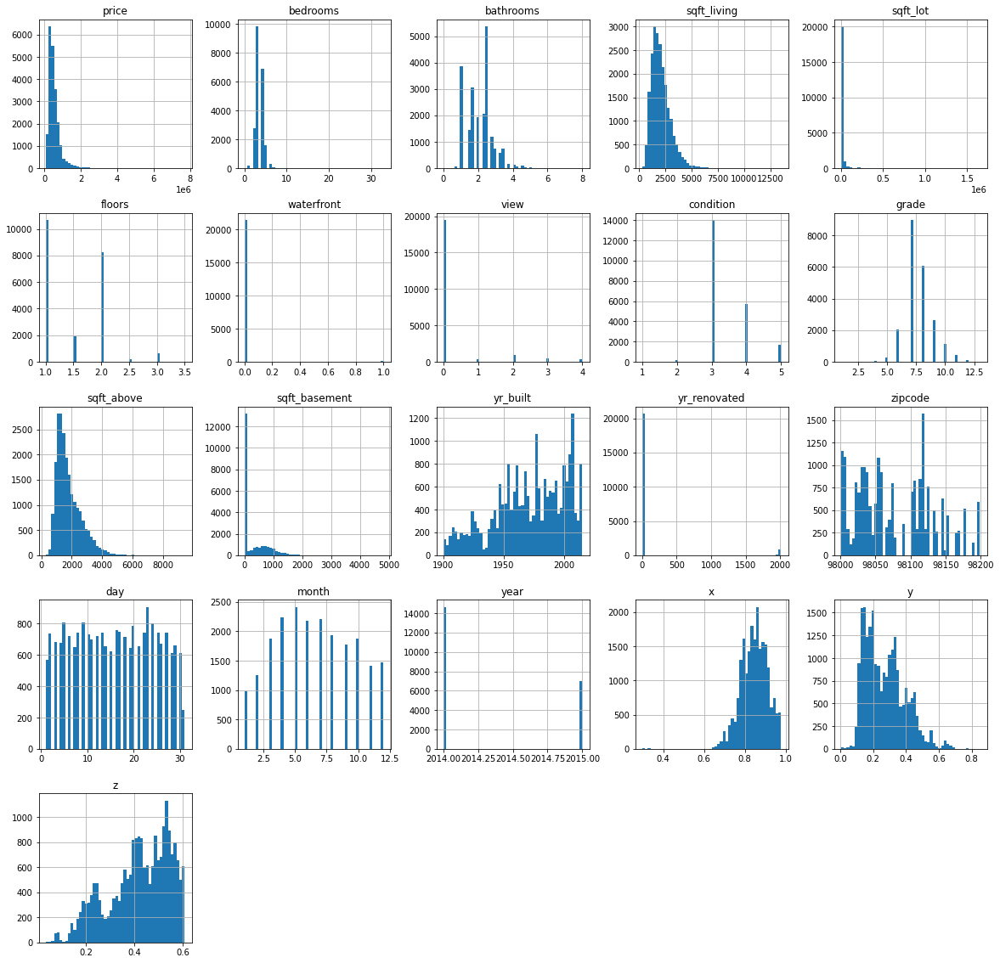

In [23]:
# check histograms for columns
df.hist(bins=50, figsize=(20,20));

In [24]:
# get all column names
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'day', 'month',
       'year', 'x', 'y', 'z'],
      dtype='object')

In [25]:
# make a dataframe copy to use original dataframe with CatBooster model
df_onehot = df.copy()

In [26]:
# one-hot encode all categorical columns
cat_cols = ['bedrooms', 'bathrooms', 'floors',
        'waterfront', 'view', 'condition', 'grade', 
        'yr_built', 'yr_renovated', 'zipcode',  
        'day', 'month', 'year']

for column in cat_cols:
    temp_df = pd.get_dummies(df_onehot[column], prefix=column, prefix_sep='_')
    df_onehot = pd.merge(left=df_onehot, right=temp_df, left_index=True, right_index=True)
    df_onehot = df_onehot.drop(columns=column)

In [27]:
# check new shape
df_onehot.shape

(21613, 382)

In [28]:
corr = df_onehot.corr()
abs(corr['price']).sort_values(ascending=False).head(20)

price            1.000000
sqft_living      0.702035
sqft_above       0.605567
view_0           0.359120
grade_11         0.357412
grade_10         0.340799
sqft_basement    0.323816
grade_7          0.315803
z                0.312969
view_4           0.307932
grade_12         0.290834
zipcode_98004    0.271131
waterfront_0     0.266369
waterfront_1     0.266369
floors_1.0       0.263588
bathrooms_1.0    0.244887
grade_9          0.235897
floors_2.0       0.232662
x                0.222993
zipcode_98039    0.212558
Name: price, dtype: float64

In [29]:
# fit a standard scaler on the training data
cols = ['sqft_living', 'sqft_lot', 'sqft_above', 
        'sqft_basement']

df_onehot[cols] = minmax_scaling(df_onehot.copy(), columns=cols)

In [30]:
df_onehot.head()

,price,sqft_living,sqft_lot,sqft_above,sqft_basement,x,y,z,bedrooms_0,bedrooms_1,...,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2014,year_2015
0,221900.0,0.067170,0.003108,0.097588,0.000000,0.893579,0.242611,0.377699,0,0,...,0,0,0,0,0,1,0,0,1,0
1,538000.0,0.172075,0.004072,0.206140,0.082988,0.809964,0.166815,0.562255,0,0,...,0,0,0,0,0,0,0,1,1,0
2,180000.0,0.036226,0.005743,0.052632,0.000000,0.783422,0.233027,0.576150,0,0,...,0,0,0,0,0,0,0,0,0,1
3,604000.0,0.126038,0.002714,0.083333,0.188797,0.914583,0.118746,0.386571,0,0,...,0,0,0,0,0,0,0,1,1,0
4,510000.0,0.104906,0.004579,0.152412,0.000000,0.782578,0.404552,0.473192,0,0,...,0,0,0,0,0,0,0,0,0,1


In [31]:
# split the data to train and test set
y = df_onehot['price']
X = df_onehot.drop(['price'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [32]:
# split the train data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,
                                    test_size=0.15, random_state=42)

In [33]:
# check the standardization of continuous columns
X_train.head()

,sqft_living,sqft_lot,sqft_above,sqft_basement,x,y,z,bedrooms_0,bedrooms_1,bedrooms_2,...,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2014,year_2015
19417,0.055094,0.003847,0.080044,0.000000,0.912527,0.169933,0.372044,0,1,0,...,0,0,1,0,0,0,0,0,1,0
2204,0.122264,0.001730,0.177632,0.000000,0.866116,0.434646,0.246832,0,0,1,...,0,1,0,0,0,0,0,0,1,0
18737,0.197736,0.003200,0.287281,0.000000,0.859810,0.454329,0.233047,0,0,0,...,0,0,1,0,0,0,0,0,1,0
7995,0.095849,0.005028,0.084430,0.103734,0.942985,0.256025,0.212673,0,0,0,...,0,0,0,1,0,0,0,0,1,0
1354,0.080000,0.002407,0.069079,0.089212,0.908816,0.130032,0.396416,0,0,1,...,0,0,0,1,0,0,0,0,1,0


In [34]:
X_train.describe()

,sqft_living,sqft_lot,sqft_above,sqft_basement,x,y,z,bedrooms_0,bedrooms_1,bedrooms_2,...,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2014,year_2015
count,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,...,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000,15615.000000
mean,0.134974,0.008812,0.164227,0.060301,0.846632,0.270258,0.418793,0.000512,0.009158,0.128850,...,0.112136,0.101825,0.101697,0.088377,0.082165,0.087480,0.066411,0.068460,0.677938,0.322062
std,0.069036,0.024351,0.090362,0.091448,0.064877,0.120797,0.126448,0.022630,0.095261,0.335045,...,0.315544,0.302428,0.302259,0.283851,0.274624,0.282546,0.249006,0.252541,0.467282,0.467282
min,0.000000,0.000000,0.000000,0.000000,0.295757,0.003036,0.035403,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.086038,0.002721,0.099781,0.000000,0.800340,0.169498,0.341780,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.122264,0.004299,0.139254,0.000000,0.849902,0.251742,0.433263,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,0.169887,0.006121,0.209430,0.116183,0.893672,0.345205,0.525762,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,1.000000,0.705262,1.000000,0.856846,0.978409,0.850703,0.608136,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Testing with Traditional Model Interpretation Methods

In [35]:
reg_models = {
        #Generalized Linear Models (GLMs)
        'elastic':{'model': linear_model.ElasticNetCV(l1_ratio=[.1, .3, .5, .7, .9, .95, .99, 1],
                                                      max_iter=5000,
                                                      n_jobs=-1)},
        'pyglmnet':{'model': GLM(max_iter=10_000, verbose=False, reg_lambda=0.1,
                                   random_state=42, score_metric='pseudo_R2', tol=1e-9)},
        'ridge':{'model': linear_model.RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1])}, 
        #Trees  
        'decision_tree':{'model': tree.DecisionTreeRegressor(max_depth=13, random_state=42)},
        #RuleFit
        'rulefit':{'model': RuleFit(max_rules=2000, rfmode='regress', random_state=42,
                                    tree_generator=ensemble.GradientBoostingRegressor(n_estimators=600, max_depth=11,
                                                                        random_state=42))}, 
        #Ensemble Methods
        'random_forest':{'model':ensemble.RandomForestRegressor(n_estimators=500, max_depth=11, n_jobs=-1,
                                                                random_state=42)},
        'gradient_boosting':{'model':ensemble.GradientBoostingRegressor(n_estimators=500, max_depth=11,
                                                                        random_state=42)},
}

In [36]:
for model_name in reg_models.keys():
    if model_name != 'rulefit':
        fitted_model = reg_models[model_name]['model'].fit(X_train, y_train)
        y_train_pred = fitted_model.predict(X_train)
        y_test_pred = fitted_model.predict(X_test)
        reg_models[model_name]['fitted'] = fitted_model
        reg_models[model_name]['preds'] = y_test_pred
        y_train_pred = np.clip(y_train_pred, 1, None)
        y_test_pred = np.clip(y_test_pred, 1, None)
        reg_models[model_name]['Log_RMSE_train'] = math.sqrt(metrics.mean_squared_error(np.log(y_train), 
                                                                                    np.log(y_train_pred)))
        reg_models[model_name]['Log_RMSE_test'] = math.sqrt(metrics.mean_squared_error(np.log(y_test), 
                                                                                    np.log(y_test_pred)))
        reg_models[model_name]['R2_test'] = metrics.r2_score(y_test, y_test_pred)
    else:
        fitted_model = reg_models[model_name]['model'].fit(X_train.values, y_train.values, X_test.columns)
        y_train_pred = fitted_model.predict(X_train.values)
        y_test_pred = fitted_model.predict(X_test.values)
        reg_models[model_name]['fitted'] = fitted_model
        reg_models[model_name]['preds'] = y_test_pred
        y_train_pred = np.clip(y_train_pred, 1, None)
        y_test_pred = np.clip(y_test_pred, 1, None)        
        reg_models[model_name]['Log_RMSE_train'] = math.sqrt(metrics.mean_squared_error(np.log(y_train), 
                                                                                    np.log(y_train_pred)))
        reg_models[model_name]['Log_RMSE_test'] = math.sqrt(metrics.mean_squared_error(np.log(y_test), 
                                                                                    np.log(y_test_pred)))
        reg_models[model_name]['R2_test'] = metrics.r2_score(y_test, y_test_pred)
    print(model_name)

elastic
Lambda: 0.1000
pyglmnet
ridge
decision_tree
rulefit
random_forest
gradient_boosting


In [37]:
reg_metrics = pd.DataFrame.from_dict(reg_models, 'index')[['Log_RMSE_train', 'Log_RMSE_test', 'R2_test']]
reg_metrics.sort_values(by='Log_RMSE_test').style.\
    background_gradient(cmap='viridis', low=1, high=0.3, subset=['Log_RMSE_train', 'Log_RMSE_test']).\
    background_gradient(cmap='plasma', low=0.3, high=1, subset=['R2_test'])

,Log_RMSE_train,Log_RMSE_test,R2_test
gradient_boosting,0.028214,0.175073,0.848001
rulefit,0.160780,0.175324,0.899146
random_forest,0.152119,0.189453,0.865318
elastic,0.221959,0.224935,0.833396
decision_tree,0.141059,0.225707,0.714999
ridge,0.225788,0.254341,0.830177
pyglmnet,0.719952,0.720935,-0.284966


### Linear Regression

In [38]:
# coefs_lm = reg_models['linear']['fitted'].coef_
# intercept_lm = reg_models['linear']['fitted'].intercept_
# print('coefficients:\t%s' % coefs_lm)
# print('intercept:\t%s' % intercept_lm)

In [39]:
# print(f'ŷ = {intercept_lm}0.2f + {coefs_lm[0]}0.4fX₁ + {coefs_lm[1]}0.4fX₂ + {coefs_lm[2]}0.3fX₃ + ...')

In [40]:
# linreg_mdl = sm.OLS(y_train, sm.add_constant(X_train))
# linreg_mdl = linreg_mdl.fit()
# linreg_mdl.summary()

In [41]:
# summary_df = linreg_mdl.summary2().tables[1]
# summary_df = summary_df.drop(['const']).reset_index().rename(columns={'index':'feature'})
# summary_df['t_abs'] = abs(summary_df['t'])
# summary_df.sort_values(by='t_abs', 
#                        ascending=False).style.background_gradient(cmap='plasma_r', 
#                         low=0, high=0.1, 
#                         subset=['P>|t|']).background_gradient(cmap='plasma_r',
#                         low=0, high=0.1, subset=['t_abs'])

### Ridge

In [42]:
coefs_ridge = reg_models['ridge']['fitted'].coef_
coef_ridge_df = pd.DataFrame({'feature':X_train.columns.values.tolist(),
                        'coef_ridge': coefs_ridge})
coef_ridge_df.style.background_gradient(cmap='viridis_r', low=0.5, 
                                        high=0.05, axis=1)

,feature,coef_ridge
0,sqft_living,761880.016534
1,sqft_lot,271216.157346
2,sqft_above,962049.113816
3,sqft_basement,274071.016820
4,x,189307.863135
5,y,-179970.845074
6,z,413855.487978
7,bedrooms_0,20414.810904
8,bedrooms_1,66746.803849
9,bedrooms_2,76329.553140


In [43]:
num_alphas = 100
alphas = np.logspace(0, 6, num_alphas)
alphas_coefs = []
for alpha in alphas:
    ridge = linear_model.Ridge(alpha=alpha).fit(X_train, y_train)
    alphas_coefs.append(np.concatenate((ridge.coef_[:8],ridge.coef_[9:])))

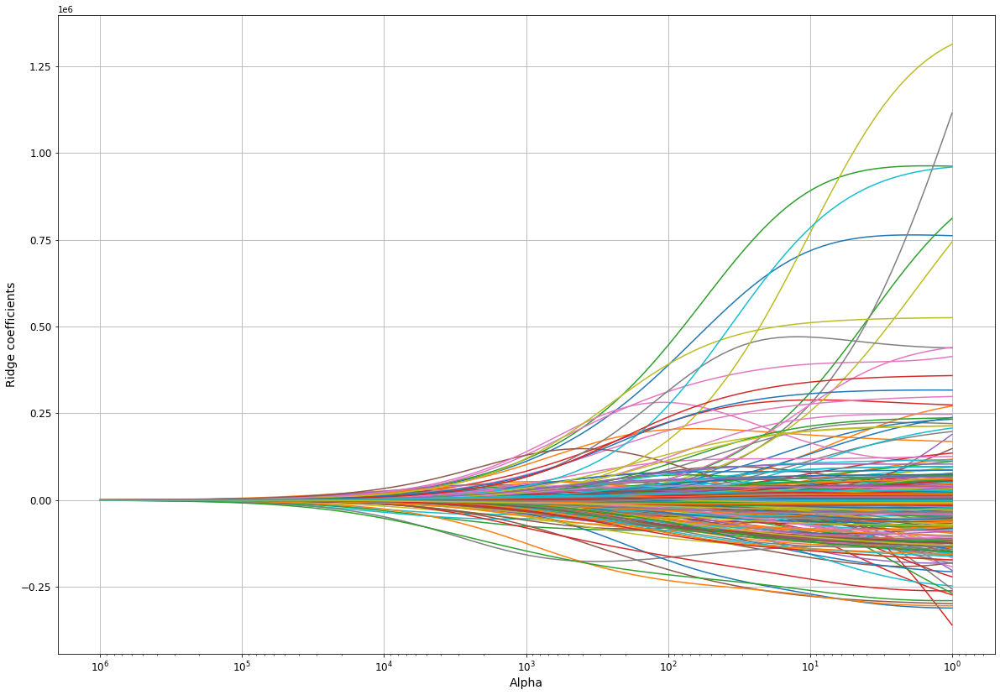

In [44]:
plt.figure(figsize = (20,14))
plt.gca().invert_xaxis()
plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
plt.plot(alphas, alphas_coefs)
plt.xscale("log")
plt.xlabel('Alpha', fontsize = 14)
plt.ylabel('Ridge coefficients', fontsize = 14)
plt.grid()
plt.show()

### ElasticNet

In [45]:
coefs_elastic = reg_models['elastic']['fitted'].coef_
coef_elastic_df = pd.DataFrame({'feature':X_train.columns.values.tolist(),
                        'coef_ridge': coefs_ridge,
                        'coef_elastic': coefs_elastic})

coef_elastic_df.style.background_gradient(cmap='viridis_r', 
                                          low=0.3, high=0.2, axis=1)

,feature,coef_ridge,coef_elastic
0,sqft_living,761880.016534,1712233.295112
1,sqft_lot,271216.157346,0.000000
2,sqft_above,962049.113816,396546.334354
3,sqft_basement,274071.016820,0.000000
4,x,189307.863135,0.000000
5,y,-179970.845074,-0.000000
6,z,413855.487978,637843.292522
7,bedrooms_0,20414.810904,-0.000000
8,bedrooms_1,66746.803849,0.000000
9,bedrooms_2,76329.553140,16879.083742


In [46]:
num_alphas = 100
alphas = np.logspace(0, 3, num_alphas)
alphas_coefs = []
for alpha in alphas:
    elastic = linear_model.ElasticNet(alpha=alpha).fit(X_train, y_train)
    alphas_coefs.append(np.concatenate((elastic.coef_[:8],elastic.coef_[9:])))

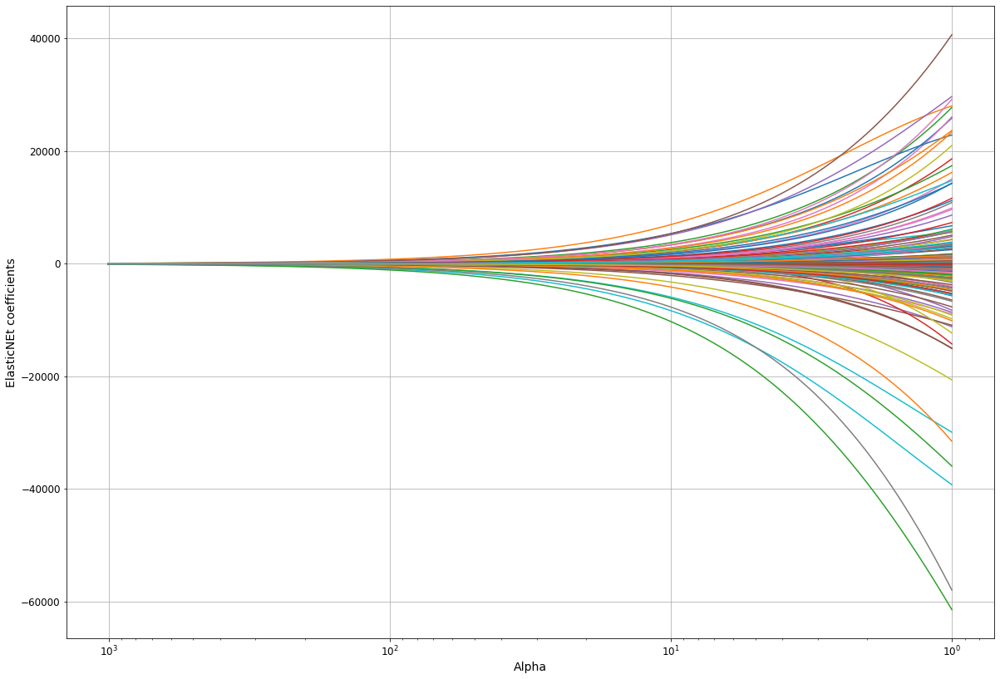

In [47]:
plt.figure(figsize = (20,14))
plt.gca().invert_xaxis()
plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
plt.plot(alphas, alphas_coefs)
plt.xscale("log")
plt.xlabel('Alpha', fontsize = 14)
plt.ylabel('ElasticNEt coefficients', fontsize = 14)
plt.grid()
plt.show()

### Decision Tree

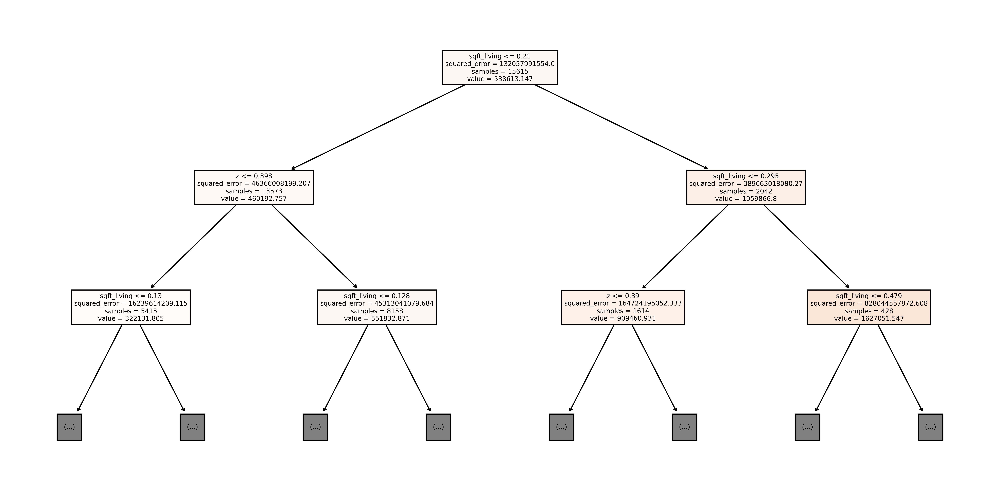

In [48]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (16,8), dpi=600)
tree.plot_tree(reg_models['decision_tree']['fitted'],
               feature_names=X_train.columns.values.tolist(), filled = True, max_depth=2)
fig.show()

In [49]:
text_tree = tree.export_text(reg_models['decision_tree']['fitted'],
               feature_names=X_train.columns.values.tolist())
print(text_tree)

|--- sqft_living <= 0.21
|   |--- z <= 0.40
|   |   |--- sqft_living <= 0.13
|   |   |   |--- sqft_living <= 0.08
|   |   |   |   |--- y <= 0.13
|   |   |   |   |   |--- view_2 <= 0.50
|   |   |   |   |   |   |--- z <= 0.22
|   |   |   |   |   |   |   |--- day_28 <= 0.50
|   |   |   |   |   |   |   |   |--- condition_3 <= 0.50
|   |   |   |   |   |   |   |   |   |--- bathrooms_1.5 <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- value: [255000.00]
|   |   |   |   |   |   |   |   |   |--- bathrooms_1.5 >  0.50
|   |   |   |   |   |   |   |   |   |   |--- value: [257500.00]
|   |   |   |   |   |   |   |   |--- condition_3 >  0.50
|   |   |   |   |   |   |   |   |   |--- bathrooms_1.5 <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- value: [231000.00]
|   |   |   |   |   |   |   |   |   |--- bathrooms_1.5 >  0.50
|   |   |   |   |   |   |   |   |   |   |--- day_5 <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- value: [218250.00]
|   |   |   |   |   |   |   |   |   |   |--

### Tree Model Feature Importance

In [50]:
dt_imp_df = pd.DataFrame({
                'name': X_train.columns,
                'dt_imp': reg_models['decision_tree']['fitted'].feature_importances_})
gb_imp_df = pd.DataFrame({
                'name': X_train.columns,
                'gb_imp': reg_models['gradient_boosting']['fitted'].feature_importances_})
rf_imp_df = pd.DataFrame({
                'name': X_train.columns,
                'rf_imp': reg_models['random_forest']['fitted'].feature_importances_})

dt_rank_df = pd.DataFrame({'dt_rank':
                           dt_imp_df['dt_imp'].rank(method='first',
                                ascending=False).astype(int)})
gb_rank_df = pd.DataFrame({'gb_rank':
                           gb_imp_df['gb_imp'].rank(method='first',
                                ascending=False).astype(int)})
rf_rank_df = pd.DataFrame({'rf_rank':
                           rf_imp_df['rf_imp'].rank(method='first',
                                ascending=False).astype(int)})

tree_ranks_df = pd.merge(
                    pd.merge(
                        pd.concat((dt_imp_df, dt_rank_df), axis=1),
                        pd.concat((gb_imp_df, gb_rank_df), axis=1),
                        'left'),
                    pd.concat((rf_imp_df, rf_rank_df), axis=1),
                    'left')

tree_ranks_df['avg_rank'] = (tree_ranks_df['dt_rank'] +
                            tree_ranks_df['gb_rank'] + 
                            tree_ranks_df['rf_rank'])/3

tree_ranks_df.sort_values(by='avg_rank')[:20]

,name,dt_imp,dt_rank,gb_imp,gb_rank,rf_imp,rf_rank,avg_rank
0,sqft_living,0.546152,1,0.525482,1,0.562128,1,1.000000
6,z,0.161539,2,0.155651,2,0.158820,2,2.000000
4,x,0.057743,3,0.061505,3,0.056848,3,3.000000
5,y,0.054520,4,0.054905,4,0.048975,4,4.000000
56,waterfront_0,0.025442,5,0.012688,8,0.022107,5,6.000000
1,sqft_lot,0.012519,8,0.020983,6,0.015674,8,7.333333
57,waterfront_1,0.010133,11,0.021164,5,0.020681,6,7.333333
73,grade_7,0.015473,7,0.010226,10,0.007299,10,9.000000
2,sqft_above,0.005553,14,0.016286,7,0.020330,7,9.333333
62,view_4,0.012389,9,0.009983,11,0.008665,9,9.666667


### RuleFit

In [51]:
rulefit_df = reg_models['rulefit']['fitted'].get_rules()
rulefit_df = rulefit_df[rulefit_df.coef != 0].sort_values(by="importance", ascending=False)

In [52]:
rulefit_df.head(15)

,rule,type,coef,support,importance
0,sqft_living,linear,1.090997e+06,1.000000,68729.718061
1131,grade_12 <= 0.5 & sqft_living <= 0.67849057912...,rule,-5.429330e+05,0.996029,34143.431373
1220,bedrooms_5 > 0.5 & y > 0.10008342936635017 & z...,rule,-1.017770e+05,0.073839,26615.624206
1359,grade_13 <= 0.5 & bedrooms_5 <= 0.5,rule,-9.832634e+04,0.924880,25917.348810
596,grade_11 <= 0.5 & grade_10 <= 0.5,rule,-9.782064e+04,0.929427,25052.893818
1776,view_0 > 0.5 & zipcode_98112 <= 0.5,rule,-7.603967e+04,0.889593,23830.524591
481,zipcode_98112 <= 0.5 & waterfront_0 > 0.5 & zi...,rule,-1.039253e+05,0.955171,21505.022948
1242,year_2014 > 0.5 & grade_13 <= 0.5,rule,-4.368984e+04,0.677554,20421.187724
750,grade_9 <= 0.5 & sqft_basement <= 0.3931535333...,rule,-5.905503e+04,0.875504,19496.793653
723,waterfront_1 <= 0.5 & zipcode_98112 <= 0.5 & z...,rule,-3.921269e+04,0.633237,18897.416630


### Explainable Boosting Machine


In [53]:
ebm = ExplainableBoostingRegressor(random_state=42, n_jobs=-1)
ebm.fit(X_train, y_train)

ExplainableBoostingRegressor(feature_names=['sqft_living', 'sqft_lot',
                                            'sqft_above', 'sqft_basement', 'x',
                                            'y', 'z', 'bedrooms_0',
                                            'bedrooms_1', 'bedrooms_2',
                                            'bedrooms_3', 'bedrooms_4',
                                            'bedrooms_5', 'bedrooms_6',
                                            'bedrooms_7', 'bedrooms_8',
                                            'bedrooms_9', 'bedrooms_10',
                                            'bedrooms_11', 'bedrooms_33',
                                            'bathrooms_0.0', 'bathrooms_0.5',
                                            'bathrooms_0.75', 'bathrooms_1.0',
                                            'ba...
                                            'continuous', 'categorical',
                                            'categorical', 'categ

In [54]:
ebm.available_explanations

['global', 'local']

In [55]:
ebm.score(X_train, y_train)

0.880680336024172

In [56]:
show(ebm.explain_global())

In [57]:
ebm_local = ebm.explain_local(X_test[:5], y_test[:5])

In [58]:
show(ebm_local)

### Permutation Importance

In [59]:
for model_name in reg_models.keys():
    if model_name != 'rulefit':
        fitted_model = reg_models[model_name]['fitted']
        permutation_imp = inspection.permutation_importance(
                            fitted_model, X_test, y_test,
                            scoring='neg_root_mean_squared_error', n_repeats=10,
                            random_state=42)
        reg_models[model_name]['importances_mean'] = permutation_imp.importances_mean
    print(model_name)

elastic
pyglmnet
ridge
decision_tree
rulefit
random_forest
gradient_boosting


In [60]:
perm_imp_df = pd.DataFrame({
                'name': X_train.columns,
                'elas_imp': reg_models['elastic']['importances_mean'],
                'pyglm_imp': reg_models['pyglmnet']['importances_mean'],
                'ridge_imp': reg_models['ridge']['importances_mean'],
                'dt_imp': reg_models['decision_tree']['importances_mean'],
                'gb_imp': reg_models['gradient_boosting']['importances_mean'],
                'rf_imp': reg_models['random_forest']['importances_mean'],
                }).reset_index(drop=True)

In [61]:
perm_imp_df['avg_imp'] = (perm_imp_df['dt_imp'] + perm_imp_df['gb_imp'] +
                         perm_imp_df['rf_imp'] +
                         perm_imp_df['elas_imp'] + perm_imp_df['ridge_imp'])/5

In [62]:
perm_imp_sorted_df = perm_imp_df.round(5).sort_values(by='avg_imp', ascending=False)
perm_imp_sorted_df.style.background_gradient(cmap='viridis_r', low=0, high=0.2,
                        subset=['elas_imp', 'ridge_imp', 'dt_imp',
                                'gb_imp', 'rf_imp'])

,name,elas_imp,ridge_imp,dt_imp,gb_imp,rf_imp,avg_imp
0,sqft_living,77470.544260,18957.962460,160742.819180,178484.617750,213636.904530,129858.569640
6,z,38425.616640,17177.978730,94552.335180,104777.005520,107874.421920,72561.471600
73,grade_7,17918.024450,98690.799060,22700.368940,7973.339770,7580.496120,30972.605670
4,x,0.000000,1044.604440,62404.235510,49513.054750,38927.303120,30377.839570
5,y,0.000000,3453.334560,41382.173240,36957.835010,34913.693630,23341.407290
74,grade_8,7417.019560,70134.532320,10364.107010,3955.104730,3366.398410,19047.432410
269,zipcode_98004,35483.154710,32102.300320,2239.802210,1254.500870,2547.492960,14725.450220
2,sqft_above,9335.533840,45073.039040,4822.587570,5442.839290,5783.780980,14091.556140
72,grade_6,8169.098240,45726.983000,1591.563060,470.680040,136.345230,11218.933920
290,zipcode_98039,19944.148440,19013.614260,-229.659670,5.183360,390.363190,7824.729910


### Partial Dependence Plot

In [63]:
# !pip install git+https://github.com/SauceCat/PDPbox.git

In [64]:
# from pdpbox import pdp

In [65]:
# feature_names = ['sqft_living', 'z', 'waterfront_1.0', 'grade_7.0']

# feature_labels = ['Sq Ft', 'Z from Lat/Long', 'Waterfront', 'Grade 7']

In [66]:
# for i in range(len(feature_names)):
#     pdp_feat_df = pdp.pdp_isolate(\
#         model=reg_models['gradient_boosting']['fitted'],\
#         dataset=pd.concat((X_test, y_test), axis=1),\
#         model_features=X_test.columns,\
#         feature=feature_names[i]
#     )
#     fig, axes = pdp.pdp_plot(
#         pdp_isolate_out=pdp_feat_df, center=True,\
#         x_quantile=True, ncols=3, plot_lines=True,\
#         frac_to_plot=100, figsize=(12,6),\
#         feature_name=feature_labels[i]
#     )

### Interaction PDP 

In [67]:
# pdp_birthn_Q1_df = pdp.pdp_interact(
#     model=reg_models['random_forest']['fitted'],\
#     dataset=pd.concat((X_test, y_test), axis=1),\
#     model_features=X_test.columns, features=['sqft_living', 'z'],\
#     n_jobs=-1
# )
# fig, axes = pdp.pdp_interact_plot(
#     pdp_interact_out=pdp_birthn_Q1_df,\
#     plot_type='grid', x_quantile=True,\
#     ncols=2, figsize=(15,15),\
#     feature_names=['Sq Ft', 'Z']
# )

### TF 

In [68]:
os.environ['PYTHONHASHSEED']=str(42)
tf.random.set_seed(42)
np.random.seed(42)

In [69]:
model = tf.keras.Sequential([
    tf.keras.Input(shape=[len(X_train.keys())]),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1)
  ])

model.compile(loss='mean_squared_error',
                optimizer=tf.keras.optimizers.Adam(lr = 0.0005),
                metrics=['mse'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              391168    
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 1024)              1049600   
                                                                 
 dropout_1 (Dropout)         (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 1)                 1025      
                                                                 
Total params: 1,441,793
Trainable params: 1,441,793
Non-trainable params: 0
_________________________________________________________________


In [70]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                      patience=10, min_delta=0.0005,
                                      restore_best_weights=True)

nn_history = model.fit(X_train.astype(float), y_train.astype(float), epochs=3000, batch_size=1024,
                validation_data=(X_val.values.astype(float), y_val.values.astype(float)),
                verbose=1, callbacks=[es])

Epoch 1/3000
16/16 [==============================] - 2s 72ms/step - loss: 422154698752.0000 - mse: 422154698752.0000 - val_loss: 416613400576.0000 - val_mse: 416613400576.0000
Epoch 2/3000
16/16 [==============================] - 1s 60ms/step - loss: 422101778432.0000 - mse: 422101778432.0000 - val_loss: 416506642432.0000 - val_mse: 416506642432.0000
Epoch 3/3000
16/16 [==============================] - 1s 60ms/step - loss: 421915000832.0000 - mse: 421915000832.0000 - val_loss: 416193478656.0000 - val_mse: 416193478656.0000
Epoch 4/3000
16/16 [==============================] - 1s 61ms/step - loss: 421448843264.0000 - mse: 421448843264.0000 - val_loss: 415509250048.0000 - val_mse: 415509250048.0000
Epoch 5/3000
16/16 [==============================] - 1s 60ms/step - loss: 420528128000.0000 - mse: 420528128000.0000 - val_loss: 414256234496.0000 - val_mse: 414256234496.0000
Epoch 6/3000
16/16 [==============================] - 1s 61ms/step - loss: 418935472128.0000 - mse: 418935472128.00

In [71]:
y_train_nn_pred = model.predict(X_train.astype(float))
y_test_nn_pred = model.predict(X_test.astype(float))

clipped_y_train_nn_pred = np.clip(y_train_nn_pred, 1, None)
clipped_y_test_nn_pred = np.clip(y_test_nn_pred, 1, None)  

RMSE_nn_train = metrics.mean_squared_error(np.log(y_train), np.log(clipped_y_train_nn_pred), squared=False)
RMSE_nn_test = metrics.mean_squared_error(np.log(y_test), np.log(clipped_y_test_nn_pred), squared=False)

R2_nn_test = metrics.r2_score(y_test, y_test_nn_pred)
print(f'RMSE_train: {RMSE_nn_train}\tRMSE_test: {RMSE_nn_test}\tr2: {R2_nn_test}')

RMSE_train: 0.17458053679076327	RMSE_test: 0.19107610478833872	r2: 0.8712664274539652


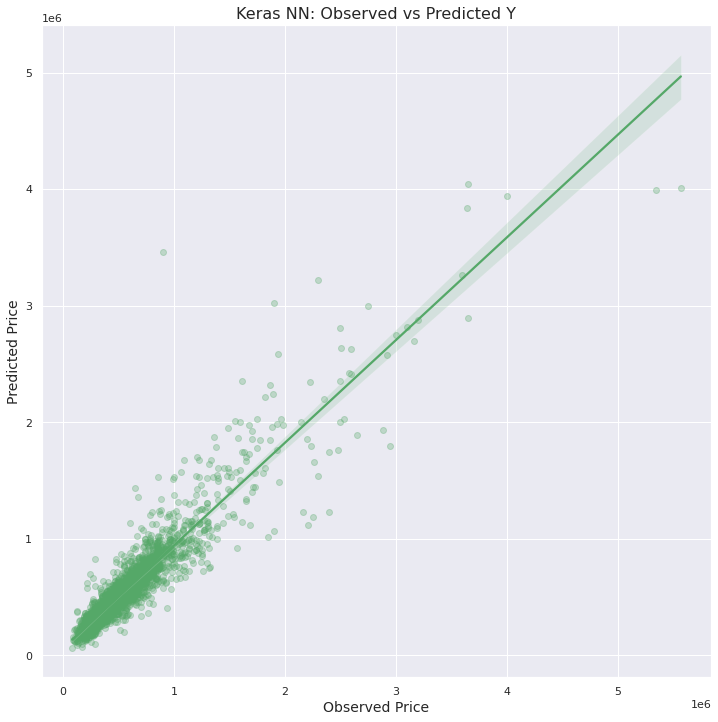

In [72]:
sns.set()
plt.figure(figsize = (12,12))
plt.title('Keras NN: Observed vs Predicted Y', fontsize=16)
plt.ylabel('Predicted Price', fontsize=14)
sns.regplot(x=y_test, y=y_test_nn_pred, color="g",\
            scatter_kws={'alpha':0.3})
plt.xlabel('Observed Price', fontsize=14)
plt.show() 

In [73]:
explainer = shap.DeepExplainer(model, X_train[:100].values.astype(float))

In [74]:
# shap_values = explainer.shap_values(X_test[:10].values.astype(float))

### XGBoost

In [75]:
fitted_xgb_model = xgb.XGBRegressor(max_depth=None, learning_rate=0.03,
                    n_jobs=-1, objective='reg:squarederror',
                    random_state=42, n_estimators=5_000).fit(X_train, y_train,
                    eval_set=[(X_train, y_train),(X_val, y_val)],
                    eval_metric='rmse')

[0]	validation_0-rmse:631846.00000	validation_1-rmse:628007.06250
[1]	validation_0-rmse:614525.18750	validation_1-rmse:611155.18750
[2]	validation_0-rmse:597728.06250	validation_1-rmse:594857.81250
[3]	validation_0-rmse:581475.93750	validation_1-rmse:579049.93750
[4]	validation_0-rmse:565685.75000	validation_1-rmse:563600.75000
[5]	validation_0-rmse:550365.12500	validation_1-rmse:548575.81250
[6]	validation_0-rmse:535555.50000	validation_1-rmse:534255.12500
[7]	validation_0-rmse:521244.18750	validation_1-rmse:520429.96875
[8]	validation_0-rmse:507301.75000	validation_1-rmse:506747.53125
[9]	validation_0-rmse:493808.12500	validation_1-rmse:493562.21875
[10]	validation_0-rmse:480757.96875	validation_1-rmse:480607.15625
[11]	validation_0-rmse:468141.46875	validation_1-rmse:468302.87500
[12]	validation_0-rmse:455884.34375	validation_1-rmse:456103.50000
[13]	validation_0-rmse:444054.40625	validation_1-rmse:444540.18750
[14]	validation_0-rmse:432560.43750	validation_1-rmse:433603.78125
[15]	

In [76]:
y_train_xgb_pred = fitted_xgb_model.predict(X_train)
y_test_xgb_pred = fitted_xgb_model.predict(X_test)

RMSE_xgb_train = math.sqrt(metrics.mean_squared_error(y_train, y_train_xgb_pred))
RMSE_xgb_test = math.sqrt(metrics.mean_squared_error(y_test, y_test_xgb_pred))

R2_xgb_test = metrics.r2_score(y_test, y_test_xgb_pred)

print('RMSE_train: %.4f\tRMSE_test: %.4f\tr2: %.4f' %\
                    (RMSE_xgb_train, RMSE_xgb_test, R2_xgb_test))

RMSE_train: 29574.1541	RMSE_test: 126145.5475	r2: 0.8957


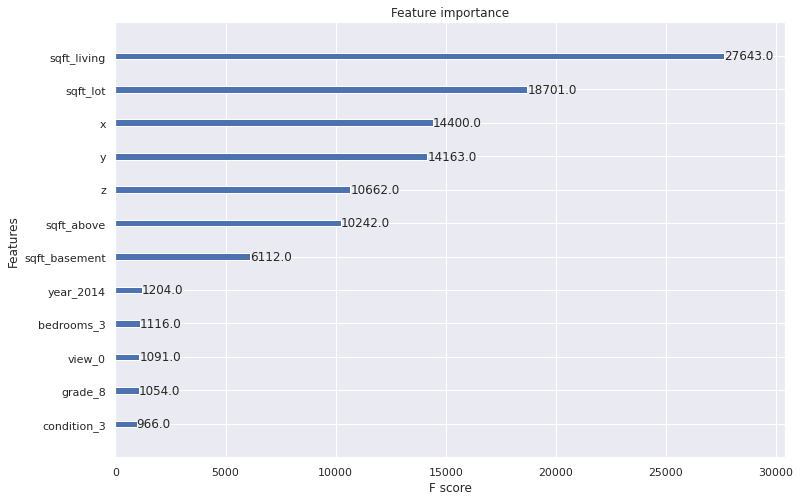

In [77]:
sns.set()
fig, ax = plt.subplots(figsize=(12, 8))
xgb.plot_importance(fitted_xgb_model, max_num_features=12, ax=ax,\
                    importance_type="weight")
plt.show()

#### XGBoost SHAP 

In [126]:
shap_xgb_explainer = shap.Explainer(fitted_xgb_model)

In [127]:
shap_xgb_values_train = shap_xgb_explainer.shap_values(X_train)
print(shap_xgb_values_train.shape)
shap_xgb_values_test = shap_xgb_explainer.shap_values(X_test)
print(shap_xgb_values_test.shape)

(15615, 381)
(3242, 381)


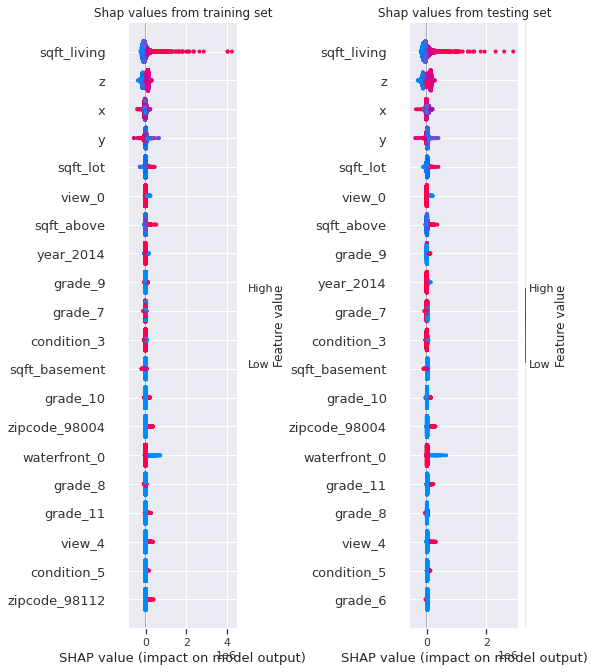

In [131]:
fig = plt.figure(figsize=(10,5))

ax1 = fig.add_subplot(121)
shap.summary_plot(shap_xgb_values_train, X_train, show=False)
ax1.title.set_text('Shap values from training set')

ax2 = fig.add_subplot(122)
shap.summary_plot(shap_xgb_values_test, X_test, show=False)
ax2.title.set_text('Shap values from testing set')
plt.tight_layout()
plt.show()

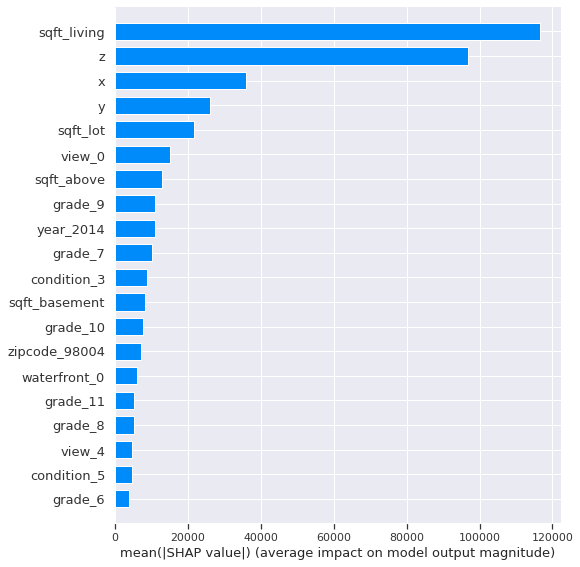

In [132]:
shap.summary_plot(shap_xgb_values_test, X_test, plot_type="bar")

In [82]:
top_features_l = ['price'] + ['sqft_living', 'z', 'x', 'y', 
                               'sqft_lot', 'view_0', 'sqft_above', 'grade_9']
top_df = df_onehot.loc[X_train.index, top_features_l]

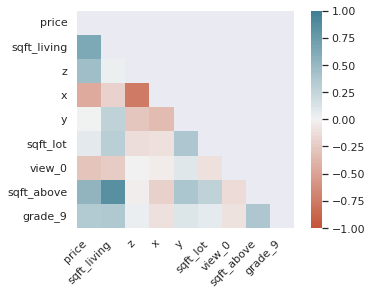

In [83]:
from scipy import stats
corrs = stats.spearmanr(top_df).correlation
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(
    corrs, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    xticklabels=top_df.columns,
    yticklabels=top_df.columns,
    mask=mask,
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

In [84]:
# force plot shows the predicted value on the y-axis and the x-axis is an observation
# shows how each shap value affects the predicted value for each sampled observation

# sample the data 
sample_test_size = 0.05
sample_test_idx = np.random.choice(X_test.shape[0],
                                   math.ceil(X_test.shape[0]*sample_test_size),\
                                   replace=False)
shap.initjs()
shap.force_plot(shap_xgb_explainer.expected_value,\
                shap_xgb_values_test[sample_test_idx],\
                X_test.iloc[sample_test_idx])

#### Decision Tree Shap

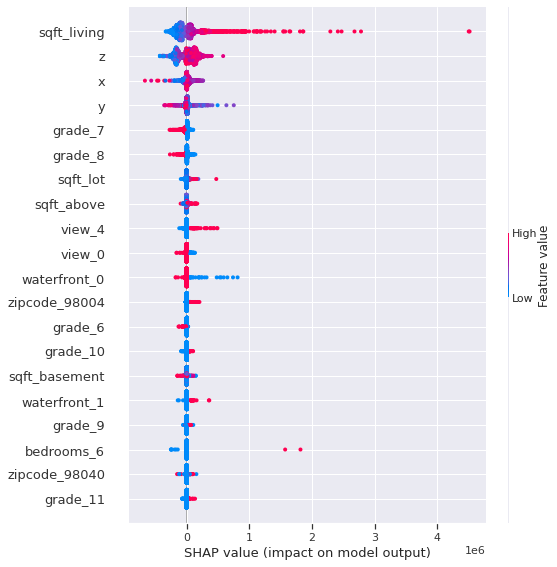

In [85]:
ex = shap.TreeExplainer(reg_models['decision_tree']['fitted'])
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

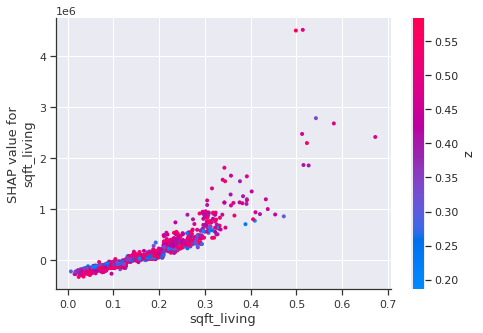

In [86]:
shap.dependence_plot("sqft_living", shap_values, X_test)

#### Random Forest Shap

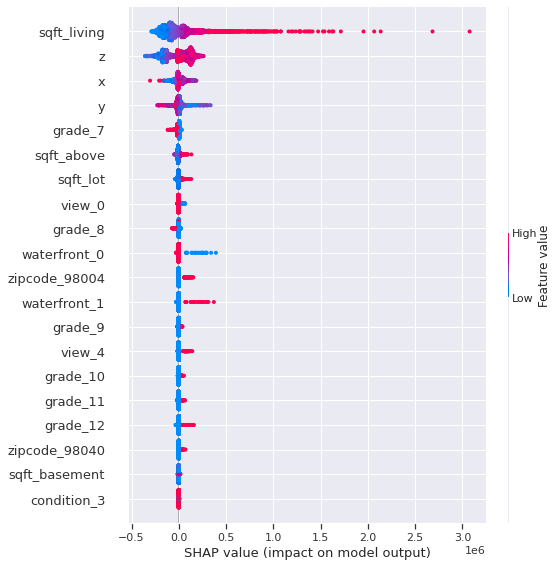

In [87]:
ex = shap.TreeExplainer(reg_models['random_forest']['fitted'])
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

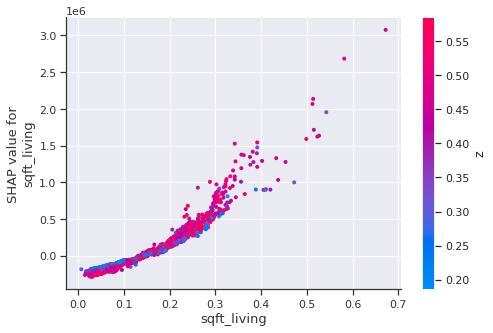

In [88]:
shap.dependence_plot("sqft_living", shap_values, X_test)

#### Gradient Boost Shap

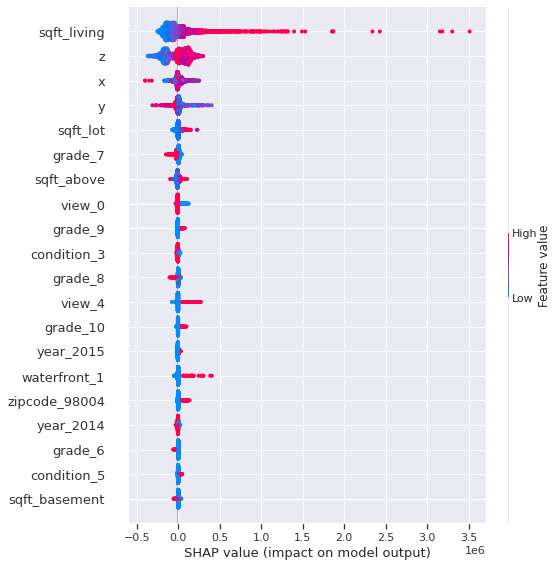

In [89]:
ex = shap.TreeExplainer(reg_models['gradient_boosting']['fitted'])
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

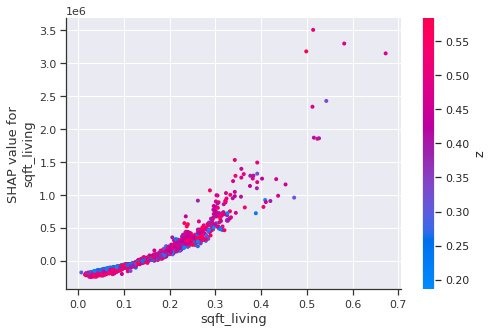

In [90]:
shap.dependence_plot("sqft_living", shap_values, X_test)

#### ElasticNet Shap

In [93]:
reg_models['elastic']['fitted'].l1_ratio_

1.0

In [ ]:
elasticnet = linear_model.ElasticNet(l1_ratio=1.0)
elasticnet.fit(X_train, y_train)

In [110]:
ex = shap.KernelExplainer(elasticnet.predict, shap.sample(X_train, 10))

In [111]:
shap_values = ex.shap_values(X_test)

  0%|          | 0/3242 [00:00<?, ?it/s]

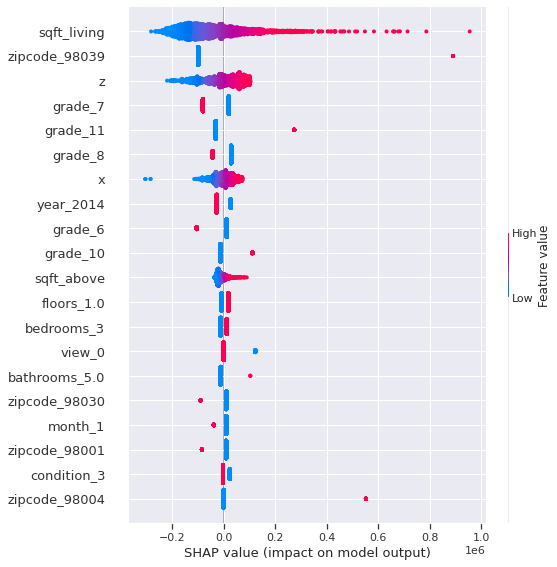

In [112]:
shap.summary_plot(shap_values, X_test)

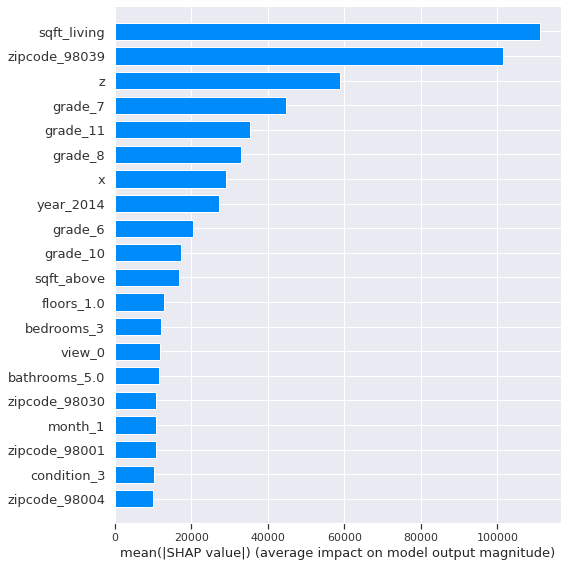

In [113]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

The expected value is 673907.8354040508


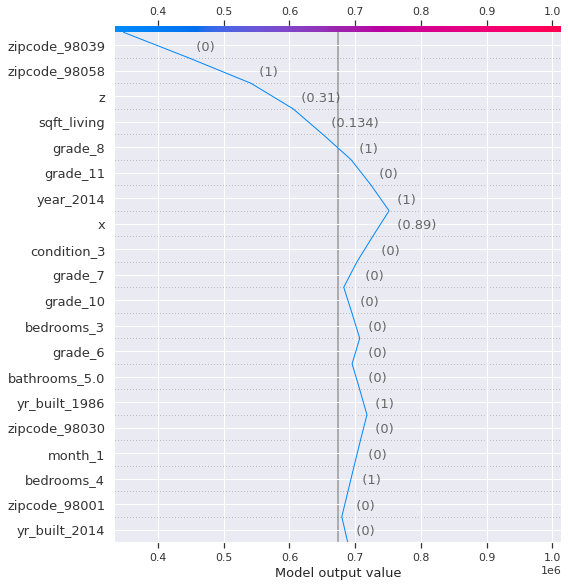

In [124]:
# decision plot for a single observation

expected_value = ex.expected_value
print(f"The expected value is {expected_value}")
shap.decision_plot(expected_value, shap_values[0], X_test)